# Examine a single BraTS scan

This notebook loads one case from the filtered dataset, prints basic metadata, and visualizes orthogonal slices with an overlay of the segmentation mask.

Default case: `BraTS-GLI-00005-100`. Change the `CASE_ID` variable in the next code cell to examine a different case.

In [1]:
# Imports and configuration
import os
from pathlib import Path
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

# Show plots inline when running in Jupyter
%matplotlib inline

ROOT = Path('..').resolve()
DATA_DIR = ROOT / 'training_data1_v2'
FILTERED_DIR = ROOT / 'training_data1_v2_filtered'
OUTPUTS = ROOT / 'outputs'
OUTPUTS.mkdir(exist_ok=True)

print('Root:', ROOT)
print('Data dir:', DATA_DIR)
print('Filtered dir:', FILTERED_DIR)
print('Outputs:', OUTPUTS)

Root: /home/gobi/glioma
Data dir: /home/gobi/glioma/training_data1_v2
Filtered dir: /home/gobi/glioma/training_data1_v2_filtered
Outputs: /home/gobi/glioma/outputs


In [2]:
# Choose case ID (change this to examine a different case)
CASE_ID = 'BraTS-GLI-00005-100'
CASE_DIR = FILTERED_DIR / CASE_ID
assert CASE_DIR.exists(), f'Case dir not found: {CASE_DIR}'
print('Case dir:', CASE_DIR)

# expected file names
FILES = {
    't1n': CASE_DIR / f'{CASE_ID}-t1n.nii.gz',
    't1c': CASE_DIR / f'{CASE_ID}-t1c.nii.gz',
    't2w': CASE_DIR / f'{CASE_ID}-t2w.nii.gz',
    't2f': CASE_DIR / f'{CASE_ID}-t2f.nii.gz',
    'seg': CASE_DIR / f'{CASE_ID}-seg.nii.gz',
}
for k,p in FILES.items():
    print(k, '->', p.exists())

Case dir: /home/gobi/glioma/training_data1_v2_filtered/BraTS-GLI-00005-100
t1n -> True
t1c -> True
t2w -> True
t2f -> True
seg -> True


In [3]:
# Load available images into memory (uses nibabel)
imgs = {}
for k,p in FILES.items():
    if p.exists():
        imgs[k] = nib.load(str(p))
    else:
        imgs[k] = None

# Show header info and shapes for present files
for k,img in imgs.items():
    if img is None:
        print(f'{k}: MISSING')
    else:
        data = img.get_fdata()
        print(f'{k}: shape={data.shape}, dtype={data.dtype}')


t1n: shape=(182, 218, 182), dtype=float64
t1c: shape=(182, 218, 182), dtype=float64
t2w: shape=(182, 218, 182), dtype=float64
t2f: shape=(182, 218, 182), dtype=float64
t2w: shape=(182, 218, 182), dtype=float64
t2f: shape=(182, 218, 182), dtype=float64
seg: shape=(182, 218, 182), dtype=float64
seg: shape=(182, 218, 182), dtype=float64


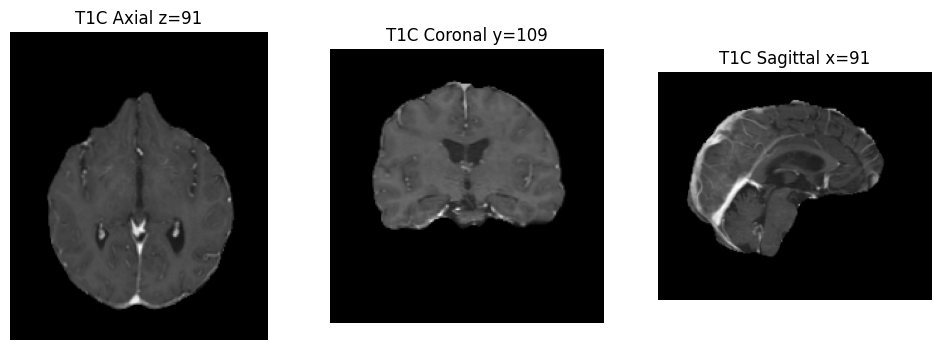

In [15]:
# Display orthogonal slices (axial, coronal, sagittal) and overlay seg (if present)
def plot_orthogonal(img_arr, seg_arr=None, slice_indices=None, cmap='gray', vmin=None, vmax=None, figsize=(12,4), title_prefix=''):
    # img_arr: numpy array (H,W,D)
    H,W,D = img_arr.shape
    if slice_indices is None:
        slice_indices = (D//2, W//2, H//2)  # axial, coronal, sagittal
    axial, coronal, sagittal = slice_indices
    fig, axes = plt.subplots(1,3,figsize=figsize)
    # axial: XY plane at z=axial
    axes[0].imshow(np.rot90(img_arr[:,:,axial]), cmap=cmap, vmin=vmin, vmax=vmax)
    axes[0].set_title(f'{title_prefix} Axial z={axial}')
    axes[0].axis('off')
    # coronal: XZ plane at y=coronal
    axes[1].imshow(np.rot90(img_arr[:,coronal,:]), cmap=cmap, vmin=vmin, vmax=vmax)
    axes[1].set_title(f'{title_prefix} Coronal y={coronal}')
    axes[1].axis('off')
    # sagittal: YZ plane at x=sagittal
    axes[2].imshow(np.rot90(img_arr[sagittal,:,:]), cmap=cmap, vmin=vmin, vmax=vmax)
    axes[2].set_title(f'{title_prefix} Sagittal x={sagittal}')
    axes[2].axis('off')
    # overlay segmentation if provided
    if seg_arr is not None:
        # overlay on axial as an example
        from matplotlib import colors
        seg_axial = seg_arr[:,:,axial]  # values 0,1,2,4
        # create a transparent colormap where 0 is transparent
        cmap_seg = colors.ListedColormap(['none', 'yellow', 'cyan', 'red'])
        # map label values to indices: labels may be 0,1,2,4. We'll remap 4->3 index
        seg_idx = np.zeros_like(seg_axial, dtype=int)
        seg_idx[seg_axial == 1] = 1
        seg_idx[seg_axial == 2] = 2
        seg_idx[seg_axial == 4] = 3
        axes[0].imshow(np.rot90(seg_idx), cmap=cmap_seg, alpha=0.5, interpolation='nearest')
    return fig

# pick a modality to show (prefer t1c, fallback t2f, then t1n)
mod = None
for m in ('t1c','t2f','t1n','t2w'):
    if imgs.get(m) is not None:
        mod = m
        break
assert mod is not None, 'No modality found for visualization'
img_arr = imgs[mod].get_fdata()
seg_arr = imgs.get('seg').get_fdata() if imgs.get('seg') is not None else None
fig = plot_orthogonal(img_arr, seg_arr=seg_arr, slice_indices=(img_arr.shape[2]//2, img_arr.shape[1]//2, img_arr.shape[0]//2), title_prefix=mod.upper())
plt.show()

In [17]:
imgs

In [18]:
# Create a 3D mesh of the segmentation using marching cubes and visualize with plotly
if seg_arr is not None:
    from skimage import measure
    import plotly.graph_objects as go

    # Use marching cubes to get the surface mesh of the segmentation
    verts, faces, normals, values = measure.marching_cubes(seg_arr, level=0.5)

    # Create a 3D plotly figure
    fig = go.Figure(data=[
        go.Mesh3d(
            x=verts[:,0], y=verts[:,1], z=verts[:,2],
            i=faces[:,0], j=faces[:,1], k=faces[:,2],
            color='lightpink', opacity=0.5,
            name='Segmentation'
        )
    ])
    fig.update_layout(scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ), title=f'3D Mesh of Segmentation for {CASE_ID}')
    # Save to HTML file
    output_html = OUTPUTS / f'mesh_{CASE_ID}.html'
    fig.write_html(str(output_html))
    print(f'3D mesh saved to {output_html}')
    fig.show()

3D mesh saved to /home/gobi/glioma/outputs/mesh_BraTS-GLI-00005-100.html


3D mesh saved to /home/gobi/glioma/outputs/mesh_BraTS-GLI-00005-100.html


In [19]:
from skimage import measure

# Create a 3D mesh of the whole brain using marching cubes and visualize with plotly
# We'll use the main MRI image (img_arr) for the brain surface
import plotly.graph_objects as go

# Choose a threshold to extract the brain surface (e.g., >0)
brain_threshold = 0.1  # adjust if needed for your data

verts_brain, faces_brain, normals_brain, values_brain = measure.marching_cubes(img_arr, level=brain_threshold)

fig_brain = go.Figure(data=[
    go.Mesh3d(
        x=verts_brain[:,0], y=verts_brain[:,1], z=verts_brain[:,2],
        i=faces_brain[:,0], j=faces_brain[:,1], k=faces_brain[:,2],
        color='lightblue', opacity=0.3,
        name='Brain Surface'
    )
])
fig_brain.update_layout(scene=dict(
    xaxis_title='X',
    yaxis_title='Y',
    zaxis_title='Z',
    aspectmode='data'
), title=f'3D Mesh of Whole Brain for {CASE_ID}')

output_html_brain = OUTPUTS / f'brain_mesh_{CASE_ID}.html'
fig_brain.write_html(str(output_html_brain))
print(f'3D brain mesh saved to {output_html_brain}')
fig_brain.show()

3D brain mesh saved to /home/gobi/glioma/outputs/brain_mesh_BraTS-GLI-00005-100.html


In [21]:
# Combine the brain and glioma meshes into a single Plotly figure and save
combined_fig = go.Figure(data=[
    go.Mesh3d(
        x=verts_brain[:,0], y=verts_brain[:,1], z=verts_brain[:,2],
        i=faces_brain[:,0], j=faces_brain[:,1], k=faces_brain[:,2],
        color='lightblue', opacity=0.25, name='Brain Surface', flatshading=True
    ),
    go.Mesh3d(
        x=verts[:,0], y=verts[:,1], z=verts[:,2],
        i=faces[:,0], j=faces[:,1], k=faces[:,2],
        color='red', opacity=0.5, name='Glioma Segmentation', flatshading=True
    )
])

combined_fig.update_layout(
    scene=dict(
        xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
        aspectmode='data'
    ),
    title=f'Combined Brain + Glioma Mesh for {CASE_ID}'
)

output_combined = OUTPUTS / f'combined_mesh_{CASE_ID}.html'
combined_fig.write_html(str(output_combined))
print(f'Combined mesh saved to {output_combined}')

combined_fig.show()

Combined mesh saved to /home/gobi/glioma/outputs/combined_mesh_BraTS-GLI-00005-100.html
